# Loan Eligibility Prediction 

#### Author: Misiriya Shahul Hameed, KAGGLEX-BIPOC Mentee, Chennai, India

This notebook was created as part of my project for the Kaggle BIPOC program. This project is based on Predicting Approvals for Banking Loans. I decided to work on the U.S. Small Business Administrations Loan datasets, which are freely available online. So, we will see here, how to deal with Loan Approval Predictions using Machine Learning in Python.

Import all the necessary libraries first.


## Install the required packages and Import necessary Libraries

In [1]:
#import sys

#!"{sys.executable}" -m pip install -U pandas-profiling[notebook]
#!jupyter nbextension enable --py widgetsnbextension

In [2]:
import pandas as pd
import numpy as np
import pandas_profiling

#data visualization libraries
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from pandas_profiling import ProfileReport

# apply styling
plt.style.use("ggplot")
#rcParams['figure.figsize'] = (12, 6)

import warnings
warnings.filterwarnings("ignore")



## Load the Dataset

Next we load the US SBA Loan dataset.

In [3]:
#Loading the dataset
Full_Data=pd.read_csv("C:\\Users\\Misiriya\\Loan_Approval_Prediction\\Dataset\\SBA_Dataset.csv",encoding='windows-1252')

Full_Data.head()

,AsOfDate,Program,BorrName,BorrStreet,BorrCity,BorrState,BorrZip,BankName,BankStreet,BankCity,...,ProjectState,SBADistrictOffice,CongressionalDistrict,BusinessType,LoanStatus,PaidInFullDate,ChargeOffDate,GrossChargeOffAmount,RevolverStatus,JobsSupported
0,20200930,7A,"CRESA PARTNERS - DENVER, INC.",7979 E TUFTS AVE PKWY STE 810,DENVER,CO,80237,"Zions Bank, A Division of",1 S Main St,SALT LAKE CITY,...,CO,COLORADO DISTRICT OFFICE,1.0,CORPORATION,PIF,31-10-2016,NaN,0,1,35
1,20200930,7A,The Hilltop Tavern,4757 Folsom Blvd,Sacramento,CA,95819,Plumas Bank,336 W Main St,QUINCY,...,CA,SACRAMENTO DISTRICT OFFICE,6.0,CORPORATION,PIF,31-03-2019,NaN,0,0,6
2,20200930,7A,River City Car Wash LLC,649 Harbor Blvd,West Sacramento,CA,95691,"Wells Fargo Bank, National Association",101 N Philips Ave,SIOUX FALLS,...,CA,SACRAMENTO DISTRICT OFFICE,3.0,CORPORATION,CHGOFF,NaN,24-08-2015,320098,0,27
3,20200930,7A,Alphagraphics,71 Newtown Road.,Danbury,CT,6810,Union Savings Bank,226 Main St,DANBURY,...,CT,CONNECTICUT DISTRICT OFFICE,5.0,CORPORATION,EXEMPT,NaN,NaN,0,1,5
4,20200930,7A,ON SITE AUTOMOTIVE APPEARANCE,603 WOODBRIDGE COURT,MIDDLEBURY,IN,46540,"VelocitySBA, LLC",9385 Haven Avenue,Rancho Cucamonga,...,IN,INDIANA DISTRICT OFFICE,3.0,INDIVIDUAL,PIF,28-02-2013,NaN,0,0,2


## Exploratory Analysis of the Dataset

Now, let's perform an Exploratory analysis of the data available in this dataset. This is a necessary step to understand the Business model and use case we are dealing with. This helps to find the relationship between the various variables, identify the potential target variables, find any anomalies in the data etc. To proceed with the Learning process, the anomalies would have to be rectified, which would be an iterative process spanning your exploratory analysis and model training steps.

In [4]:
#.shape returns the pair (row, columns) of the DataFrame
Full_Data.shape

(588053, 36)

In [5]:
#This method displays for each variable, the total count of values, no. of unique values,
#frequency, mean, std deviation etc for numerical values, and the most frequent values in both categorical and numerical variables.
Full_Data.describe(include='all')


,AsOfDate,Program,BorrName,BorrStreet,BorrCity,BorrState,BorrZip,BankName,BankStreet,BankCity,...,ProjectState,SBADistrictOffice,CongressionalDistrict,BusinessType,LoanStatus,PaidInFullDate,ChargeOffDate,GrossChargeOffAmount,RevolverStatus,JobsSupported
count,588053.0,588053,588016,588053,588053,588053,588053.000000,588053,588049,588049,...,588053,588053,588018.000000,588048,588053,222841,20669,5.880530e+05,588053.000000,588053.000000
unique,NaN,1,477025,510557,26981,58,NaN,3258,3469,2184,...,58,74,NaN,3,5,130,2184,NaN,NaN,NaN
top,NaN,7A,Entity to be formed,TBD,LOS ANGELES,CA,NaN,"Wells Fargo Bank, National Association",101 N Philips Ave,COLUMBUS,...,CA,LOS ANGELES DISTRICT OFFICE,NaN,CORPORATION,EXEMPT,31-10-2019,22-02-2019,NaN,NaN,NaN
freq,NaN,588053,45,67,4451,73442,NaN,46635,46635,76399,...,73437,24831,NaN,516179,262008,3819,70,NaN,NaN,NaN
mean,20200930.0,NaN,NaN,NaN,NaN,NaN,52318.166747,NaN,NaN,NaN,...,NaN,NaN,10.241255,NaN,NaN,NaN,NaN,4.305255e+03,0.314691,10.720804
std,0.0,NaN,NaN,NaN,NaN,NaN,30775.379800,NaN,NaN,NaN,...,NaN,NaN,11.014161,NaN,NaN,NaN,NaN,5.035034e+04,0.464393,20.425223
min,20200930.0,NaN,NaN,NaN,NaN,NaN,601.000000,NaN,NaN,NaN,...,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,0.000000e+00,0.000000,0.000000
25%,20200930.0,NaN,NaN,NaN,NaN,NaN,27954.000000,NaN,NaN,NaN,...,NaN,NaN,3.000000,NaN,NaN,NaN,NaN,0.000000e+00,0.000000,2.000000
50%,20200930.0,NaN,NaN,NaN,NaN,NaN,50613.000000,NaN,NaN,NaN,...,NaN,NaN,6.000000,NaN,NaN,NaN,NaN,0.000000e+00,0.000000,5.000000
75%,20200930.0,NaN,NaN,NaN,NaN,NaN,80238.000000,NaN,NaN,NaN,...,NaN,NaN,13.000000,NaN,NaN,NaN,NaN,0.000000e+00,1.000000,11.000000


The include parameter is set to 'all' so that all datatypes are included in the description. For the string datatypes, details such as unique, top and frequency are also displayed.
Using the .info() function, we obtained the list of attributes in the dataset, and also their datatypes. In our current dataset, the Loan Approval information is provided by the LoanStatus Attribute. 

In [6]:
#To display the data types and the list of variables. 
#.info() also helps us identify variables that have missing or null values
Full_Data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 588053 entries, 0 to 588052
Data columns (total 36 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   AsOfDate               588053 non-null  int64  
 1   Program                588053 non-null  object 
 2   BorrName               588016 non-null  object 
 3   BorrStreet             588053 non-null  object 
 4   BorrCity               588053 non-null  object 
 5   BorrState              588053 non-null  object 
 6   BorrZip                588053 non-null  int64  
 7   BankName               588053 non-null  object 
 8   BankStreet             588049 non-null  object 
 9   BankCity               588049 non-null  object 
 10  BankState              588049 non-null  object 
 11  BankZip                588049 non-null  object 
 12  GrossApproval          588053 non-null  int64  
 13  SBAGuaranteedApproval  588053 non-null  int64  
 14  ApprovalDate           588053 non-nu

### Pandas Profiling to Visualize information regarding the Dataset

From the output, we can see that there are inconsistencies in the data. The variables are a mix of categorical and numerical.
Some have null values, i.e., missing data, and these need to be rectified.
Let's generate a full report about the dataset using pandas_profiling profile report.. Pandas Profiling is a function which automates the whole process of Exploratory analysis reporting.

In [7]:
profile = ProfileReport(Full_Data,
                        title="U.S. SBA Loan Data Analysis",
        dataset={
        "description": "This profiling report was generated as part of Misiriya's KaggleX BIPOC project",
        "copyright_year": "2023",
        },)
#output the profile
profile


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
#Save the Profile Report. This can be done to a json file or an html file. Let's save it to an html file.
profile.to_file("Misiriya_SBA_Dataset_Analysis.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### Target Variable

The variable which helps us identify whether the candidate is eligible for Loan is the 'LoanStatus' Variable. From the data profiling and also after looking through the dataset, we understand the different values of 'LoanStatus' variable are:'EXEMPT','PIF'(Paid in full), 'CANCLD', 'CHGOFF'(Charged Off) and 'COMMIT'. Of these values, the records that help us in identifying features relevant to predict whether a business is eligible for Loan are the ones with values 'PIF' and 'CHGOFF'.
[reference:https://www.tandfonline.com/doi/full/10.1080/10691898.2018.1434342]

We can add another column to the dataframe based on these two values to identify defaulters. Column name can be "Defaulter" and values can be"Yes" and "No".

In [9]:
#Let's drop the rows that have values other than 'PIF' and 'CHGOFF'

Exempt_Rows =Full_Data[ Full_Data['LoanStatus'] == 'EXEMPT'].index
Full_Data.drop(Exempt_Rows, inplace = True)

Cancld_Rows =Full_Data[ Full_Data['LoanStatus'] == 'CANCLD'].index
Full_Data.drop(Cancld_Rows, inplace = True)

Commit_Rows =Full_Data[ Full_Data['LoanStatus'] == 'COMMIT'].index
Full_Data.drop(Commit_Rows, inplace = True)

Full_Data.shape

(243511, 36)

In [10]:
#Add Column 'Defaulter' based on LoanStatus values, setting Yes to those who were charged off and No to those who paid in full

Full_Data['Defaulter']= Full_Data['LoanStatus'].apply(lambda x: "No" if x == 'PIF' else 'Yes')

Full_Data.head()
                               

,AsOfDate,Program,BorrName,BorrStreet,BorrCity,BorrState,BorrZip,BankName,BankStreet,BankCity,...,SBADistrictOffice,CongressionalDistrict,BusinessType,LoanStatus,PaidInFullDate,ChargeOffDate,GrossChargeOffAmount,RevolverStatus,JobsSupported,Defaulter
0,20200930,7A,"CRESA PARTNERS - DENVER, INC.",7979 E TUFTS AVE PKWY STE 810,DENVER,CO,80237,"Zions Bank, A Division of",1 S Main St,SALT LAKE CITY,...,COLORADO DISTRICT OFFICE,1.0,CORPORATION,PIF,31-10-2016,NaN,0,1,35,No
1,20200930,7A,The Hilltop Tavern,4757 Folsom Blvd,Sacramento,CA,95819,Plumas Bank,336 W Main St,QUINCY,...,SACRAMENTO DISTRICT OFFICE,6.0,CORPORATION,PIF,31-03-2019,NaN,0,0,6,No
2,20200930,7A,River City Car Wash LLC,649 Harbor Blvd,West Sacramento,CA,95691,"Wells Fargo Bank, National Association",101 N Philips Ave,SIOUX FALLS,...,SACRAMENTO DISTRICT OFFICE,3.0,CORPORATION,CHGOFF,NaN,24-08-2015,320098,0,27,Yes
4,20200930,7A,ON SITE AUTOMOTIVE APPEARANCE,603 WOODBRIDGE COURT,MIDDLEBURY,IN,46540,"VelocitySBA, LLC",9385 Haven Avenue,Rancho Cucamonga,...,INDIANA DISTRICT OFFICE,3.0,INDIVIDUAL,PIF,28-02-2013,NaN,0,0,2,No
5,20200930,7A,AW ENTERPRISES,106 WEST LAKE STREET,CAMDEN,TN,38320,"VelocitySBA, LLC",9385 Haven Avenue,Rancho Cucamonga,...,TENNESSEE DISTRICT OFFICE,7.0,INDIVIDUAL,PIF,31-10-2019,NaN,0,0,3,No


### Remove Duplicate Rows

In [11]:
#The report identified duplicate rows, hence we remove those rows here
Full_Data=Full_Data.drop_duplicates()

Full_Data.shape

(243315, 37)

## Visualize Relations Between Data

<AxesSubplot:xlabel='Defaulter', ylabel='JobsSupported'>

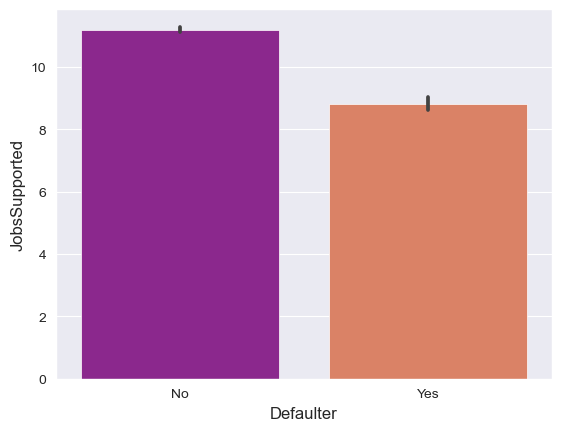

In [12]:
# set the background style of the plot
sns.set_style('darkgrid')
 
# plot the graph using the default estimator mean
sns.barplot(x ='Defaulter', y ='JobsSupported', data = Full_Data, palette ='plasma')
 


<AxesSubplot:xlabel='Defaulter', ylabel='TermInMonths'>

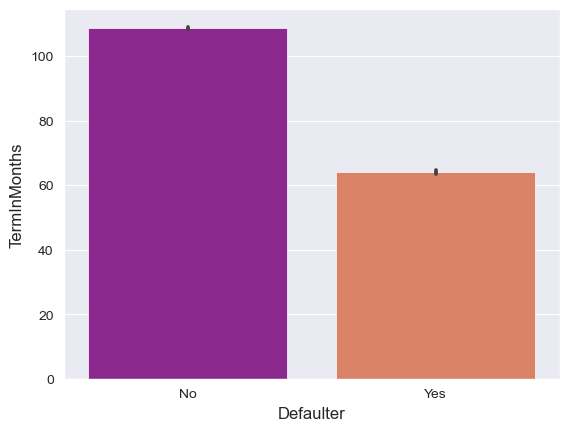

In [13]:
# plot the graph using the default estimator mean
sns.barplot(x ='Defaulter', y ='TermInMonths', data = Full_Data, palette ='plasma')

In [14]:
#Convert Date fields to datetime format
Full_Data['ApprovalDate'] = pd.to_datetime(Full_Data['ApprovalDate'].str.strip(), format='%d-%m-%Y')

In [15]:
#Lets check how many transactions or records are present for each Approval Date
Full_Data.groupby('ApprovalDate').size()

ApprovalDate
2009-10-01    114
2009-10-02    142
2009-10-05    138
2009-10-06    160
2009-10-07    134
             ... 
2020-05-06      1
2020-05-08      1
2020-05-29      1
2020-06-01      1
2020-06-08      1
Length: 3261, dtype: int64

In [16]:
# Using a inbuilt style to change
# the look and feel of the plot
#plt.style.use("fivethirtyeight")
 
#Full_Data["ApprovalDate"] =Full_Data["ApprovalDate"].astype("datetime64")
# setting figure size to 12, 10
#plt.figure(figsize=(15, 10))
 
# Labelling the axes and setting a
# title
#plt.xlabel("Approval Date")
#plt.ylabel("Defaulter")
#plt.title("Bar Plot of Approval Date and Defaulter")
 
# plotting the Defaulter column alone
#plt.bar(Full_Data.index, Full_Data["Defaulter"], width=5)

From the grouping, we can see that there is an almost uniform distribution of data on the different approval dates. 

In [17]:
#Lets check how many transactions or records are present for each Approval Fiscal Year
Full_Data.groupby('ApprovalFiscalYear').size()

ApprovalFiscalYear
2010    37037
2011    39818
2012    32525
2013    30465
2014    29620
2015    29435
2016    21347
2017    13799
2018     7047
2019     2030
2020      192
dtype: int64

<AxesSubplot:xlabel='Defaulter', ylabel='ApprovalFiscalYear'>

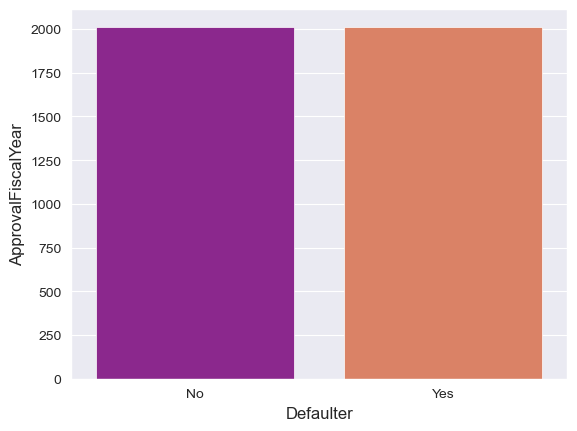

In [18]:
# plot the graph using the default estimator mean
sns.barplot(x ='Defaulter', y ='ApprovalFiscalYear', data = Full_Data, palette ='plasma')

## Visualize Relationships between categorical data

Defaulter         No    Yes
BusinessType               
CORPORATION   192673  17470
INDIVIDUAL     25992   2966
PARTNERSHIP     3977    234


<AxesSubplot:xlabel='BusinessType'>

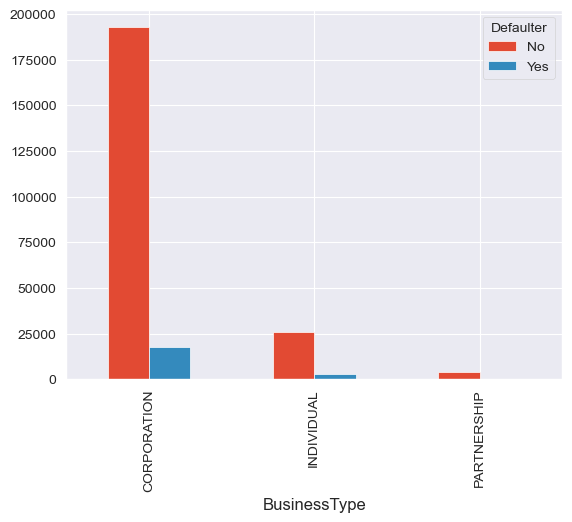

In [19]:
# Cross tabulation between BusinessType and LOANSTATUS/Defaulter variables
CrosstabResult=pd.crosstab(index=Full_Data['BusinessType'],columns=Full_Data['Defaulter'])
print(CrosstabResult)
CrosstabResult.plot.bar()

## Encoding the Categorical Variables

Our dataset consists of several categorical variables. Due to High cardinality of some attributes, we discarded some of them, since variables with cardinality more than even 50 % in a large dataset makes training our model less efficient. The next thing is the requirement of numeric input/output variables by many Machine Learning Models. Since we have several attributes that are categorical, it is best to encode them using one of the Encoding methods that are available. Then we can apply algorithms from the for modeling. Let's use encoding for our categorical variables.

In [20]:
#We have a very large dataset with categorical data. So lets take a smaller dataset, pertaining to a certain 'Project State', in order to quickly process our algorithm.
Data_filtered = Full_Data[Full_Data['ProjectState']=="NY"]

Project_State="NY"
 
# Print the new dataframe
Data_filtered.head()



,AsOfDate,Program,BorrName,BorrStreet,BorrCity,BorrState,BorrZip,BankName,BankStreet,BankCity,...,SBADistrictOffice,CongressionalDistrict,BusinessType,LoanStatus,PaidInFullDate,ChargeOffDate,GrossChargeOffAmount,RevolverStatus,JobsSupported,Defaulter
22,20200930,7A,545 Johanny Barber Shop Inc/Jo,545 West 125th Street.,Manhattan,NY,10027,Lower East Side People's FCU,37 Ave B,NEW YORK CITY,...,NEW YORK DISTRICT OFFICE,13.0,CORPORATION,PIF,31-10-2014,NaN,0,0,4,No
32,20200930,7A,Dr Nick Gabriel,48 Route 25A Ste 104,SMITHTOWN,NY,11787,"JPMorgan Chase Bank, National Association",1111 Polaris Pkwy,COLUMBUS,...,MELVILLE BRANCH OFFICE,1.0,INDIVIDUAL,PIF,31-07-2014,NaN,0,0,2,No
33,20200930,7A,COMPUTER CONFIDENCE INC.,80 OFFICE PARKWAY STE 3,PITTSFORD,NY,14534,"Citizens Bank, National Association",1 Citizens Plaza,PROVIDENCE,...,ROCHESTER BRANCH OFFICE,25.0,CORPORATION,PIF,31-08-2012,NaN,0,1,9,No
89,20200930,7A,New York KomTang House Corp.,32 West 32nd Street,New York,NY,10001,Shinhan Bank America,475 Park Ave S 4th Flr,NEW YORK CITY,...,NEW YORK DISTRICT OFFICE,10.0,CORPORATION,PIF,30-11-2013,NaN,0,0,13,No
91,20200930,7A,F Monti Enterprises Ltd,444 Latta Rd,ROCHESTER,NY,14612,KeyBank National Association,127 Public Sq,CLEVELAND,...,ROCHESTER BRANCH OFFICE,25.0,CORPORATION,PIF,30-11-2016,NaN,0,0,3,No


In [21]:
Dataset_Size=len(Data_filtered)

# Print the shape of the dataframe
Data_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15131 entries, 22 to 560477
Data columns (total 37 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   AsOfDate               15131 non-null  int64         
 1   Program                15131 non-null  object        
 2   BorrName               15130 non-null  object        
 3   BorrStreet             15131 non-null  object        
 4   BorrCity               15131 non-null  object        
 5   BorrState              15131 non-null  object        
 6   BorrZip                15131 non-null  int64         
 7   BankName               15131 non-null  object        
 8   BankStreet             15131 non-null  object        
 9   BankCity               15131 non-null  object        
 10  BankState              15131 non-null  object        
 11  BankZip                15131 non-null  object        
 12  GrossApproval          15131 non-null  int64         
 13 

### OneHotEncoder()

In [22]:
#import Encoder library files from sklearn
from sklearn.preprocessing import OneHotEncoder,LabelEncoder

#fill in missing values 
#We might encounter missing values when we take different samplings of the dataset.
#Based on our discover during exploratory analysis, we need to deal with such variables
#Data_filtered=Data_filtered['BusinessType'].fillna("Not Mentioned", inplace = True)
#Data_filtered=Data_filtered['CongressionalDistrict'].fillna(method='pad')

#Removing Columns since they both are highly correlated, and it has the same value in this subset of our data, i.e., name of the state
Data_filtered.drop(['ProjectState','SBADistrictOffice','BusinessType'],axis=1)

#create an instance
#drop='first' is called a dummy variable trap, and drops the dummy column

#OHE = OneHotEncoder(drop='first')

#OHE_df = pd.DataFrame(OHE.fit_transform(Data_filtered[['BusinessType']]).toarray())
#OHE_df.info()

#Data_New =Data_filtered.join(OHE_df)
#Data_New.head()


,AsOfDate,Program,BorrName,BorrStreet,BorrCity,BorrState,BorrZip,BankName,BankStreet,BankCity,...,FranchiseName,ProjectCounty,CongressionalDistrict,LoanStatus,PaidInFullDate,ChargeOffDate,GrossChargeOffAmount,RevolverStatus,JobsSupported,Defaulter
22,20200930,7A,545 Johanny Barber Shop Inc/Jo,545 West 125th Street.,Manhattan,NY,10027,Lower East Side People's FCU,37 Ave B,NEW YORK CITY,...,NaN,NEW YORK,13.0,PIF,31-10-2014,NaN,0,0,4,No
32,20200930,7A,Dr Nick Gabriel,48 Route 25A Ste 104,SMITHTOWN,NY,11787,"JPMorgan Chase Bank, National Association",1111 Polaris Pkwy,COLUMBUS,...,NaN,SUFFOLK,1.0,PIF,31-07-2014,NaN,0,0,2,No
33,20200930,7A,COMPUTER CONFIDENCE INC.,80 OFFICE PARKWAY STE 3,PITTSFORD,NY,14534,"Citizens Bank, National Association",1 Citizens Plaza,PROVIDENCE,...,NaN,MONROE,25.0,PIF,31-08-2012,NaN,0,1,9,No
89,20200930,7A,New York KomTang House Corp.,32 West 32nd Street,New York,NY,10001,Shinhan Bank America,475 Park Ave S 4th Flr,NEW YORK CITY,...,NaN,NEW YORK,10.0,PIF,30-11-2013,NaN,0,0,13,No
91,20200930,7A,F Monti Enterprises Ltd,444 Latta Rd,ROCHESTER,NY,14612,KeyBank National Association,127 Public Sq,CLEVELAND,...,NaN,MONROE,25.0,PIF,30-11-2016,NaN,0,0,3,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
552457,20200930,7A,Eberly Excavating,5606 STATE ROUTE 14A,DUNDEE,NY,14837,Five Star Bank,55 N Main St,WARSAW,...,NaN,YATES,23.0,PIF,31-05-2020,NaN,0,0,1,No
555486,20200930,7A,KORUCE LLC,1151 State Route 55 suite 201,Lagrangeville,NY,12540,Manufacturers and Traders Trust Company,"One M & T Plaza, 15th Fl",BUFFALO,...,NaN,DUTCHESS,19.0,PIF,31-05-2020,NaN,0,0,1,No
556948,20200930,7A,"ANTHONY CICCONE AGENCY, INC.",684 5TH AVE C/O ALLSTATE CO,BROOKLYN,NY,11215,"JPMorgan Chase Bank, National Association",1111 Polaris Pkwy,COLUMBUS,...,NaN,KINGS,7.0,PIF,31-08-2020,NaN,0,1,0,No
558323,20200930,7A,RIKKEL CORP,544 Park Ave Ste 107,Brooklyn,NY,11205,Manufacturers and Traders Trust Company,"One M & T Plaza, 15th Fl",BUFFALO,...,NaN,KINGS,8.0,PIF,31-08-2020,NaN,0,1,0,No


In [23]:
#drop 'BusinessType' column
#Data_New.drop('BusinessType', axis=1, inplace=True)

Data_filtered.info()



<class 'pandas.core.frame.DataFrame'>
Int64Index: 15131 entries, 22 to 560477
Data columns (total 37 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   AsOfDate               15131 non-null  int64         
 1   Program                15131 non-null  object        
 2   BorrName               15130 non-null  object        
 3   BorrStreet             15131 non-null  object        
 4   BorrCity               15131 non-null  object        
 5   BorrState              15131 non-null  object        
 6   BorrZip                15131 non-null  int64         
 7   BankName               15131 non-null  object        
 8   BankStreet             15131 non-null  object        
 9   BankCity               15131 non-null  object        
 10  BankState              15131 non-null  object        
 11  BankZip                15131 non-null  object        
 12  GrossApproval          15131 non-null  int64         
 13 

### LabelEncoder()

In [24]:
#Many algorithms we intend to run do not support categorical variables
#Wecan encode the target variable usng LabelEncoder()
LE=LabelEncoder()

Data_filtered['LoanStatus']=LE.fit_transform(Data_filtered['LoanStatus'])
Data_filtered['LoanStatus'].describe()

count    15131.000000
mean         0.913621
std          0.280932
min          0.000000
25%          1.000000
50%          1.000000
75%          1.000000
max          1.000000
Name: LoanStatus, dtype: float64

In [25]:
Data_filtered['Defaulter']=LE.fit_transform(Data_filtered['Defaulter'])

Data_filtered['Defaulter'].describe()

count    15131.000000
mean         0.086379
std          0.280932
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: Defaulter, dtype: float64

In [26]:
x_data=Data_filtered[['ApprovalFiscalYear','InitialInterestRate','TermInMonths','NaicsCode','CongressionalDistrict','JobsSupported']]
y_data=Data_filtered['Defaulter']

In [27]:
x_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15131 entries, 22 to 560477
Data columns (total 6 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ApprovalFiscalYear     15131 non-null  int64  
 1   InitialInterestRate    15131 non-null  float64
 2   TermInMonths           15131 non-null  int64  
 3   NaicsCode              15130 non-null  float64
 4   CongressionalDistrict  15131 non-null  float64
 5   JobsSupported          15131 non-null  int64  
dtypes: float64(3), int64(3)
memory usage: 827.5 KB


In [28]:
#NaicsCode has a missing value. 
#Here I filled it with the most frequently occurring value, identified from Pandas_Profile report.
#When the Columns have null values, it gives an error in further processes

x_data['NaicsCode'].fillna(722511, inplace = True)


In [29]:
x_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15131 entries, 22 to 560477
Data columns (total 6 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ApprovalFiscalYear     15131 non-null  int64  
 1   InitialInterestRate    15131 non-null  float64
 2   TermInMonths           15131 non-null  int64  
 3   NaicsCode              15131 non-null  float64
 4   CongressionalDistrict  15131 non-null  float64
 5   JobsSupported          15131 non-null  int64  
dtypes: float64(3), int64(3)
memory usage: 827.5 KB


In [30]:
y_data.info()

<class 'pandas.core.series.Series'>
Int64Index: 15131 entries, 22 to 560477
Series name: Defaulter
Non-Null Count  Dtype
--------------  -----
15131 non-null  int32
dtypes: int32(1)
memory usage: 177.3 KB


In [31]:
#x_data=x_data.dropna()
#x_newdata = x_data[np.isfinite(x_data).all(1)]
#x_newdata =x_newdata.reset_index()

## Splitting the Dataset into Training and Testing Sets

We need to split the data into Training set and Test Set in order to perform Training and Modeling of the Machine Learning algorithm. Let's use the sklearn library to do this. We must arrange the dataset as features and target attributes, before we can proceed, since we have raw data with us. Here, the outcome or target labels are in the "LoanStatus" Column. So we can set that as the target variable. 

In [32]:
#Split the Dataset into training and testing sets
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x_data, y_data, test_size = 0.2, shuffle=False)

x_train.shape, x_test.shape, y_train.shape, y_test.shape



((12104, 6), (3027, 6), (12104,), (3027,))

## Train a Model using the training set and make predictions using Test set

The next steps are iterative, until we find the best model that gives accurate results. With this loan dataset, we can try out the modeling with data from different project States of USA. Set the Project state value to the different values in that column. This helps you to get different datasets to try out.

The next thing is to change the size of the Training set and Testing set and to run the models again, until we find the best model. These and other parameters related to different Machine Learning Algorithms are hyper parameters, that can be tuned until we get the best model. 

In [33]:
# Normalizing the features for stable and fast training.
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)



In [34]:
#Import necessary libraries from sklearn
from sklearn.metrics import roc_auc_score
from sklearn.metrics import classification_report, confusion_matrix,ConfusionMatrixDisplay

## Decision Tree

In [35]:
# import the regressor
from sklearn.tree import DecisionTreeRegressor 

  
# create a regressor object
regressor = DecisionTreeRegressor(random_state = 0) 
  
# fit the regressor with X and Y data
regressor.fit(x_train, y_train)

DecisionTreeRegressor(random_state=0)

In [36]:
print('Training Accuracy : ', roc_auc_score(y_train, regressor.predict(x_train)))
print('Validation Accuracy : ', roc_auc_score(y_test, regressor.predict(x_test)))
print()

Training Accuracy :  1.0
Validation Accuracy :  0.6952576623558033



In [37]:
print("Project State:",Project_State)
print("Size of Dataset:",Dataset_Size)

Project State: NY
Size of Dataset: 15131


## Support Vector Machine

In [38]:
from sklearn.svm import SVC
model = SVC(kernel='rbf')
model.fit(x_train, y_train)
  


SVC()

In [39]:
print('Training Accuracy : ', roc_auc_score(y_train, model.predict(x_train)))
print('Validation Accuracy : ', roc_auc_score(y_test, model.predict(x_test)))
print()

Training Accuracy :  0.6046065295750378
Validation Accuracy :  0.5031545741324921



In [40]:
LE_result_decode = dict(zip(LE.classes_, LE.transform(LE.classes_)))
print(LE_result_decode)

{'No': 0, 'Yes': 1}


In [41]:
confusion_matrix(y_train, model.predict(x_train))

array([[11048,    66],
       [  777,   213]], dtype=int64)

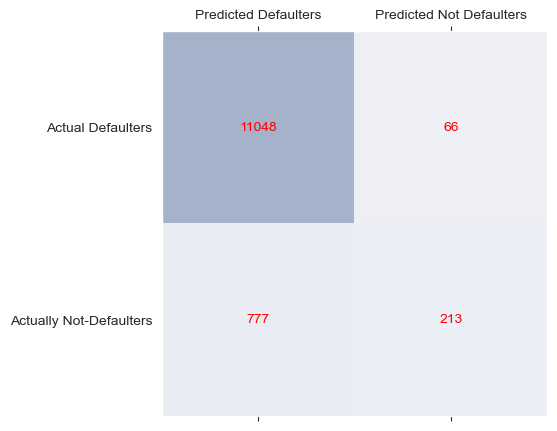

In [42]:
cm = confusion_matrix(y_train, model.predict(x_train))
fig, ax = plt.subplots(figsize=(5, 5))
#ax.imshow(cm)
ax.matshow(cm, cmap=plt.cm.Blues, alpha=0.3)
ax.grid(False)
ax.xaxis.set(ticks=(0, 1), ticklabels=('Predicted Defaulters', 'Predicted Not Defaulters'))
ax.yaxis.set(ticks=(0, 1), ticklabels=('Actual Defaulters', 'Actually Not-Defaulters'))
ax.set_ylim(1.5, -0.5)
for i in range(2):
    for j in range(2):
        ax.text(j, i, cm[i, j], ha='center', va='center', color='red')
plt.show()

In [43]:
print(classification_report(y_train, model.predict(x_train)))

              precision    recall  f1-score   support

           0       0.93      0.99      0.96     11114
           1       0.76      0.22      0.34       990

    accuracy                           0.93     12104
   macro avg       0.85      0.60      0.65     12104
weighted avg       0.92      0.93      0.91     12104



## Logistic Regression

In [44]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

model = LogisticRegression(solver='liblinear', random_state=0)

model.fit(x_train, y_train)


LogisticRegression(random_state=0, solver='liblinear')

In [45]:
model.predict_proba(x_train)

array([[0.84397341, 0.15602659],
       [0.94387349, 0.05612651],
       [0.97882572, 0.02117428],
       ...,
       [0.96260224, 0.03739776],
       [0.972112  , 0.027888  ],
       [0.99380936, 0.00619064]])

In [46]:
model.predict(x_train)

array([0, 0, 0, ..., 0, 0, 0])

In [47]:
model.score(x_train, y_train)

0.9279576999339062

In [48]:
confusion_matrix(y_train, model.predict(x_train))

array([[10979,   135],
       [  737,   253]], dtype=int64)

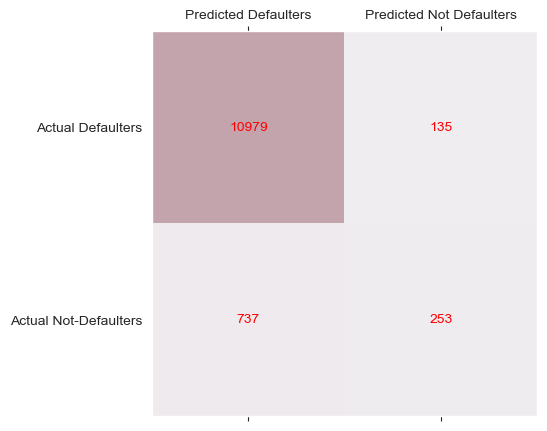

In [49]:
cm = confusion_matrix(y_train, model.predict(x_train))
fig, ax = plt.subplots(figsize=(5, 5))
ax.matshow(cm, cmap=plt.cm.Reds, alpha=0.3)
ax.grid(False)
ax.xaxis.set(ticks=(0, 1), ticklabels=('Predicted Defaulters', 'Predicted Not Defaulters'))
ax.yaxis.set(ticks=(0, 1), ticklabels=('Actual Defaulters', 'Actual Not-Defaulters'))
ax.set_ylim(1.5, -0.5)
for i in range(2):
    for j in range(2):
        ax.text(j, i, cm[i, j], ha='center', va='center', color='red')
plt.show()

In [50]:
print(classification_report(y_train, model.predict(x_train)))

              precision    recall  f1-score   support

           0       0.94      0.99      0.96     11114
           1       0.65      0.26      0.37       990

    accuracy                           0.93     12104
   macro avg       0.79      0.62      0.66     12104
weighted avg       0.91      0.93      0.91     12104



## Naive Bayes Classifier

In [51]:
from sklearn.naive_bayes import GaussianNB

# Build a Gaussian Classifier
model = GaussianNB()

# Model training
model.fit(x_train, y_train)


GaussianNB()

In [52]:
# Predict Output
#The index value in x_test is the i-th record in the test dataset. This can be changed as per record size.
predicted = model.predict([x_test[3000]])


In [53]:
print("Actual Value:", y_test)


Actual Value: 293192    0
293199    0
293231    1
293324    1
293556    0
         ..
552457    0
555486    0
556948    0
558323    0
560477    0
Name: Defaulter, Length: 3027, dtype: int32


In [54]:
print("Predicted Value:", predicted)
print(LE_result_decode)

Predicted Value: [0]
{'No': 0, 'Yes': 1}


## Comparison of Algorithms

In [55]:
from sklearn import model_selection
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis


In [56]:
# prepare configuration for cross validation test harness
seed = 3
# prepare models
models = []
models.append(('LR', LogisticRegression()))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('NB', GaussianNB()))
models.append(('SVM', SVC()))

In [57]:
# evaluate each model in turn
results = []
names=[]
scoring = 'accuracy'
for name, model in models:
 kfold = model_selection.KFold(n_splits=10)
 cv_results = model_selection.cross_val_score(model, x_train, y_train, cv=kfold, scoring=scoring)
 results.append(cv_results)
 names.append(name)
 msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
 print(msg)


LR: 0.927378 (0.006535)
LDA: 0.918210 (0.006669)
KNN: 0.921595 (0.007862)
CART: 0.931261 (0.009920)
NB: 0.918375 (0.006626)
SVM: 0.928288 (0.007383)


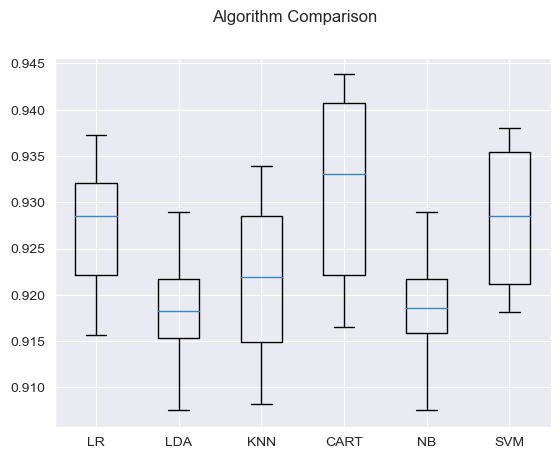

In [58]:
# boxplot algorithm comparison
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

## References:

##### https://www.tandfonline.com/doi/epdf/10.1080/10691898.2018.1434342?needAccess=true&role=button
##### https://towardsdatascience.com/predict-loan-eligibility-using-machine-learning-models-7a14ef904057
##### https://github.com/mridulrb/Predict-loan-eligibility-using-IBM-Watson-Studio
##### https://www.analyticsvidhya.com/blog/2022/05/loan-prediction-problem-from-scratch-to-end/
##### https://www.kdnuggets.com/2021/05/deal-with-categorical-data-machine-learning.html

#### Data Profiling: 
##### https://towardsdatascience.com/automated-data-profiling-99523e51048e
##### https://towardsdatascience.com/exploratory-data-analysis-in-python-a-step-by-step-process-d0dfa6bf94ee
##### https://realpython.com/logistic-regression-python/

#### Visualize relationship between categorical data:
How to visualize the relationship between two categorical variables in Python - Thinking Neuron

#### Training and Splitting
##### https://www.aboutdatablog.com/post/splitting-your-data-to-fit-any-machine-learning-model

#### Dataset:
##### https://data.world/nerb/sba-loan-guarantee-data/workspace/file?filename=7a_504_FOIA%2520Data%2520Dictionary.xlsx

##### Categorical encoding cheat sheet
##### https://www.kdnuggets.com/2021/05/deal-with-categorical-data-machine-learning.html
